# Fast Fourier Transform and Soundwaves

The Fast Fourier Transform (fft) is a computational way to convert a signal from the time domain to the frequency domain. Essentially, it takes a periodic signal and breaks it up into a bunch of sine and cosine waves of different frequencies, and when you add all those sine and cosine waves back together, you get your original signal. Once you have it broken up into frequencies, you can turn different frequencies up or down, like boosting the bass in your car's EQ.

## Sound waves

First, some simple sine waves to see what's happening. If I plot a sine wave $f=\sin(x)$, it looks like this:

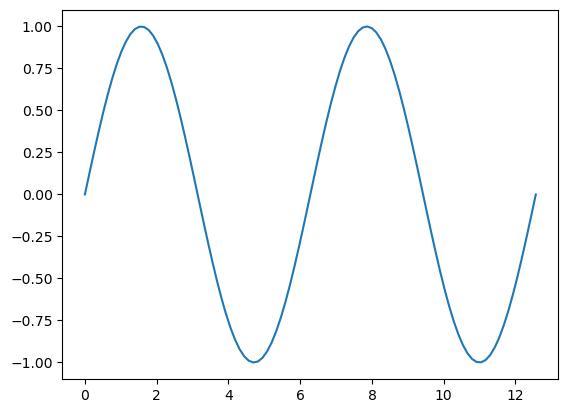

In [1]:
import numpy as np
import matplotlib.pyplot as plt

t = np.linspace(0,4*np.pi,100)
sin_wave = np.sin(t)

plt.plot(t,sin_wave)
plt.show()

The wave will repeat itself every $2\pi\approx6.283$, meaning it has a frequency (number of complete waves per second) of $\frac{1}{2\pi}\approx0.159$. If you plot $f=\sin(2\pi\omega x)$, it will have frequency $\omega$. So if $\omega=440$ you'll get a sine wave with frequency 440 Hz, which is an A4 on the piano:

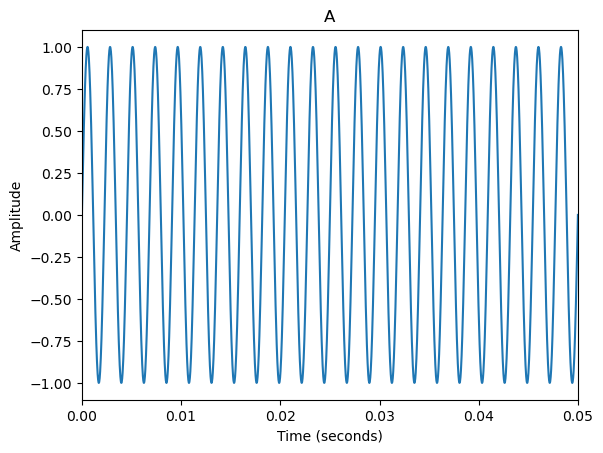

In [2]:
from IPython.display import Audio
from modules.fft_soundwaves import SoundWave, generate_note

# generate and plot
A = generate_note(440,3)
A.plot()
plt.title('A')
plt.ylim(-1.1,1.1)
plt.xlim(0,.05)
plt.show()

# export and display
A.export('data/A.wav',force=True)
Audio(filename='data/A.wav')

Now, if I take a sine wave with $\omega=440$ and add it to a sine wave with $\omega=523$, I'll get a chord that looks and sounds like this:

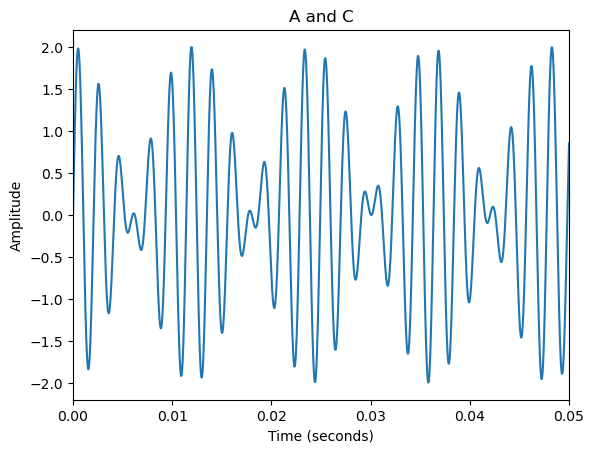

In [3]:
# generate and plot
A = generate_note(440, 3)
C = generate_note(523.25, 3)
chord = A + C
chord.plot()
plt.title('A and C')
plt.ylim(-2.2,2.2)
plt.xlim(0,.05)
plt.show()

# export and display
chord.export('data/AC.wav',force=True)
Audio(filename='data/AC.wav')

But if I was just given a soundwave like the one above, how could I tell what notes it was playing? You wouldn't want to see this wave in the time domain, you would want to see it in the frequency domain. Instead of plotting amplitude over time you want amplitude over frequency, meaning how much of each frequency is present in this wave. The Fourier Transform allows you to do just that. By projecting your sound wave onto a basis of sine waves in all the frequencies, you can see how much A is present in your wave, and how much C is present. For details on how it actually works, see [wikipedia](https://en.wikipedia.org/wiki/Fourier_transform)

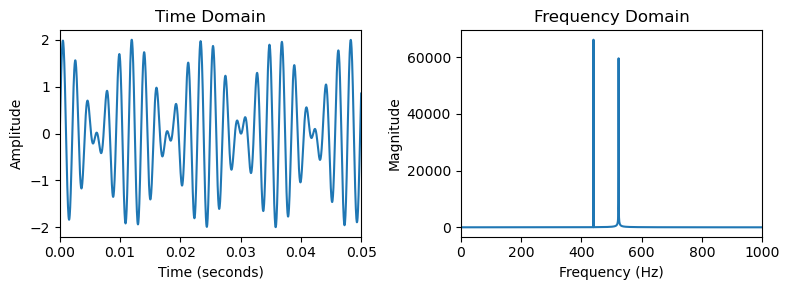

In [4]:
# plot time and frequency domain
plt.figure(figsize=(8,3))
chord.plot(frequency=True, xmin=0, xmax=1000)
plt.subplot(121)
plt.xlim(0,.05)
plt.show()

## Filtering

Here's our first cool application. If I take an audio recording and run the Fourier Transform (fft) on it I get a magnitude for each frequency present. But then I can manipulate those frequencies and run the Inverse Fourier Transform (ifft) to reconstruct a signal in the time domain but with those manipulations. So let's take a noisy audio recording from Neil Armstrong and see what frequencies are present:

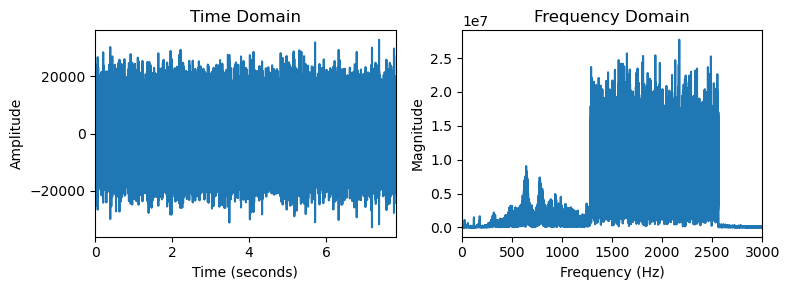

In [5]:
from scipy.io import wavfile

# import and plot
plt.figure(figsize=(8,3))
armstrong = SoundWave(*wavfile.read('data/armstrong.wav'))
armstrong.plot(frequency=True, xmin=0, xmax=3000)
plt.show()

# display
Audio(filename='data/armstrong.wav')

It seems like there's a lot of extra noise in the higher frequencies, and since the human voice doesn't usually get above 1000 Hz, we can just delete all the frequencies from 1250-3000, then reconstruct the sound wave after deleting them in the frequency domain:

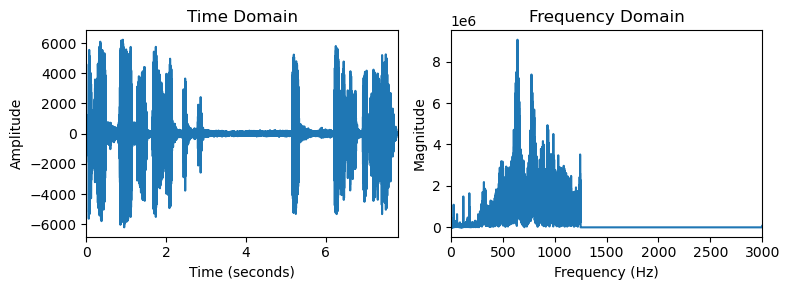

In [6]:
# clean and plot
armstrong.clean(1250,3000)
plt.figure(figsize=(8,3))
armstrong.plot(frequency=True, xmin=0, xmax=3000)
plt.show()

# export and display
armstrong.export('data/armstrong_clean.wav')
Audio(filename='data/armstrong_clean.wav')

Or here's an example from the 2010 FIFA World Cup in South Africa. Fans had brought plastic horns called vuvuzelas and were blowing them so hard the announcers had to shout to be heard over the noise. Luckily, the vuvuzelas only play notes in the 200-500 Hz range, so if we delete those, we can hear the announcers much better

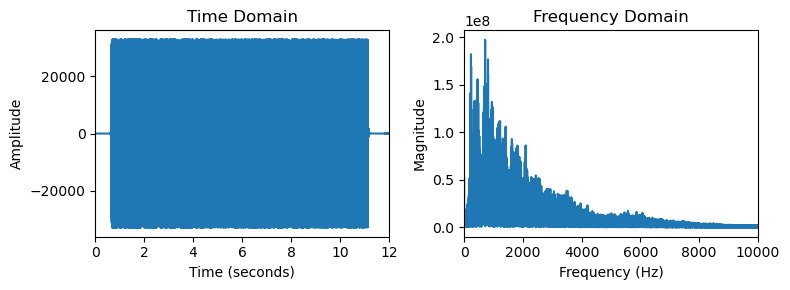

In [7]:
# import
rate, samples = wavfile.read('data/vuvuzela.wav')
left = SoundWave(rate,samples[:,0])
right = SoundWave(rate,samples[:,1])

# plot
plt.figure(figsize=(8,3))
right.plot(frequency=True, xmin=0, xmax=10000)
plt.show()

# display
Audio(filename='data/vuvuzela.wav')

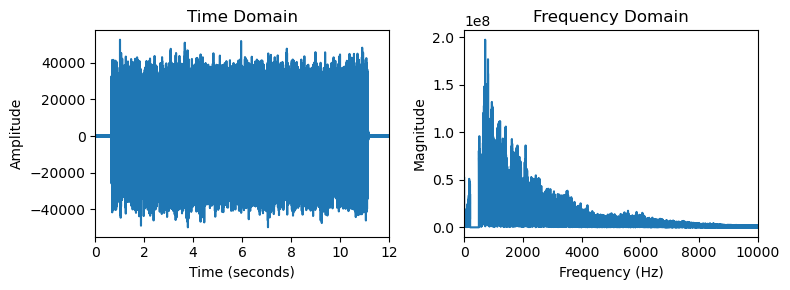

In [8]:
# clean and plot
left.clean(200,500)
right.clean(200,500)
plt.figure(figsize=(8,3))
right.plot(frequency=True, xmin=0, xmax=10000)
plt.show()

combined = np.vstack((left.samples,right.samples))
Audio(rate=rate, data=combined)

## Convolution Theory

Another operation you can do in the frequency domain is convolution. In the time domain, convolution is a pretty complicated operation. When you convolve signal $a$ and signal $b$, for each entry in the output you take elements from $a$ and $b$, multiply them by each other and add them all together, but you go in opposite directions and you offset them by different numbers. So if you wanted to convolve $x=[6,3,0,-1,2]$ with $y=[-2,4,1,5,-3]$, it might look like this:

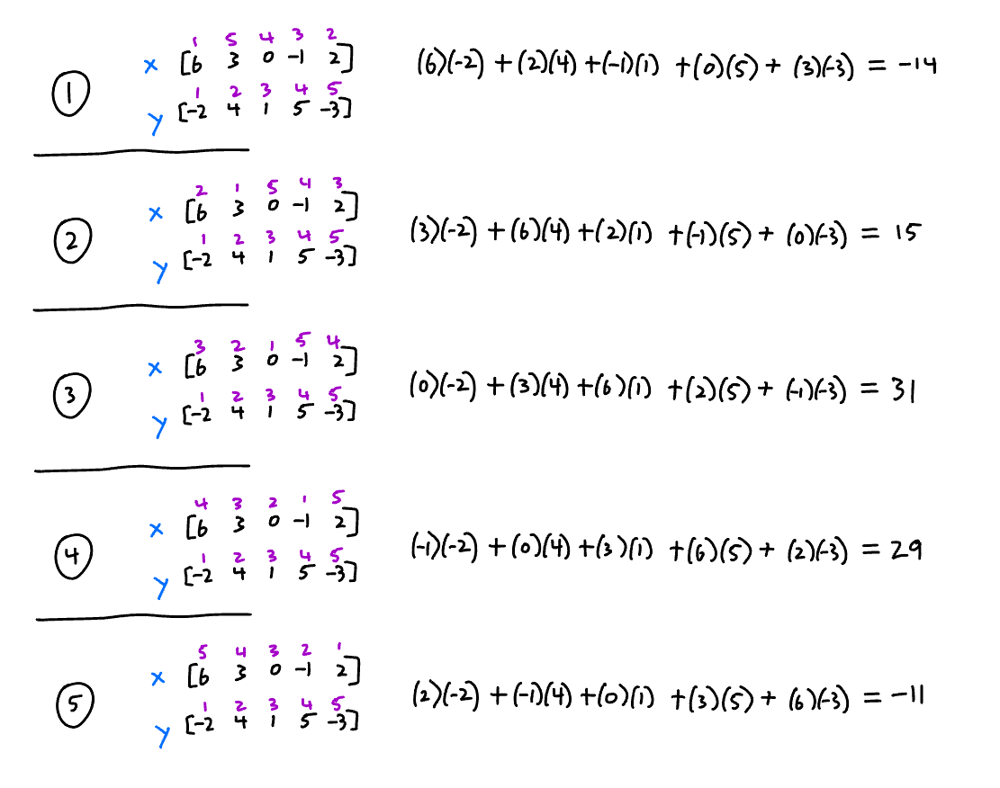

At each step we multiply the elements of $x$ in reverse order by the elements of $y$ in forwards order, offset by the step we're on, and the output $(x*y)=[-14,15,31,29,-11]$. Pretty complicated.

But in the frequency domain, this same convolution can be accomplished by taking the fft of each signal, multiplying those together, and then taking the inverse fft. So $(x*y)=\text{ifft}(\text{fft}(x)\cdot \text{fft}(y))$. And multiplying the signals together in the frequency domain is much faster than convolving the signals in the time domain.

Convolution ties every part of the output to every part of both inputs, effectively mixing their signals in a specific way. This lets you apply certain properties of one signal to another. 

## Convolution Application

Let's start with a recording of a piano being played in a room with very little reverb:

In [9]:
Audio(filename='data/chopin.wav')

And another recording of a balloon popping in a hallway with lots of reverb:

In [10]:
Audio(filename='data/balloon.wav')

The balloon popping acts as a sharp inpulse signal, and all the sound after that reflects how an impulse echoes in the hallway. When we convolve the balloon signal onto the piano signal, it takes each impulse of the piano and convolves the echo of the hallway onto it, making it sound like the piano was being played in a great hall:

In [11]:
# import and convolve
chopin = SoundWave(*wavfile.read('data/chopin.wav'))
balloon = SoundWave(*wavfile.read('data/balloon.wav'))
chopin_reverb = chopin**balloon

# export and display
chopin_reverb.export('data/chopin_reverb.wav',force=True)
Audio(filename='data/chopin_reverb.wav')

Pretty cool, huh? Working with signals in the frequency domain can result in some pretty cool applications. Just about anything your computer does with sound waves is bound to use the Fourier Transform.